# Housing Price Prediction 

## Overview

This project assumes a sscenario in which the goal is to analyze and provide meaningful insights from the publicly available data and provide recommendation to stakeholders from a Data Science perspective.

## Business Problem

The housing supply is lower in the Seattle housing market and the number of buyers outweigh the available homes for sale. Therefore investing on real estate could result in higher return on investments. With this potential business opportunity, the Infinity Real Estate is looking to expand on their real estate portfolio in the King County region. But they want to understand which key variables to focus on so that their investment will yield greater return. This study is focused creating model that will accurately predict the housing price and therefore help Infinity Real Estate agency to focus on key features.

### Stakeholders
Infinity Real Estates

## Data loading and Preparation

In [9]:
# Your code here - remember to use markdown cells for comments as well!
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')

import datetime
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_score

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.utils import shuffle
from sklearn.preprocessing import PolynomialFeatures

import statsmodels.api as sm

import scipy.stats as stats
from scipy.stats import norm

### Load Data

In [10]:
df = pd.read_csv('data/kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

### Basic Exploration

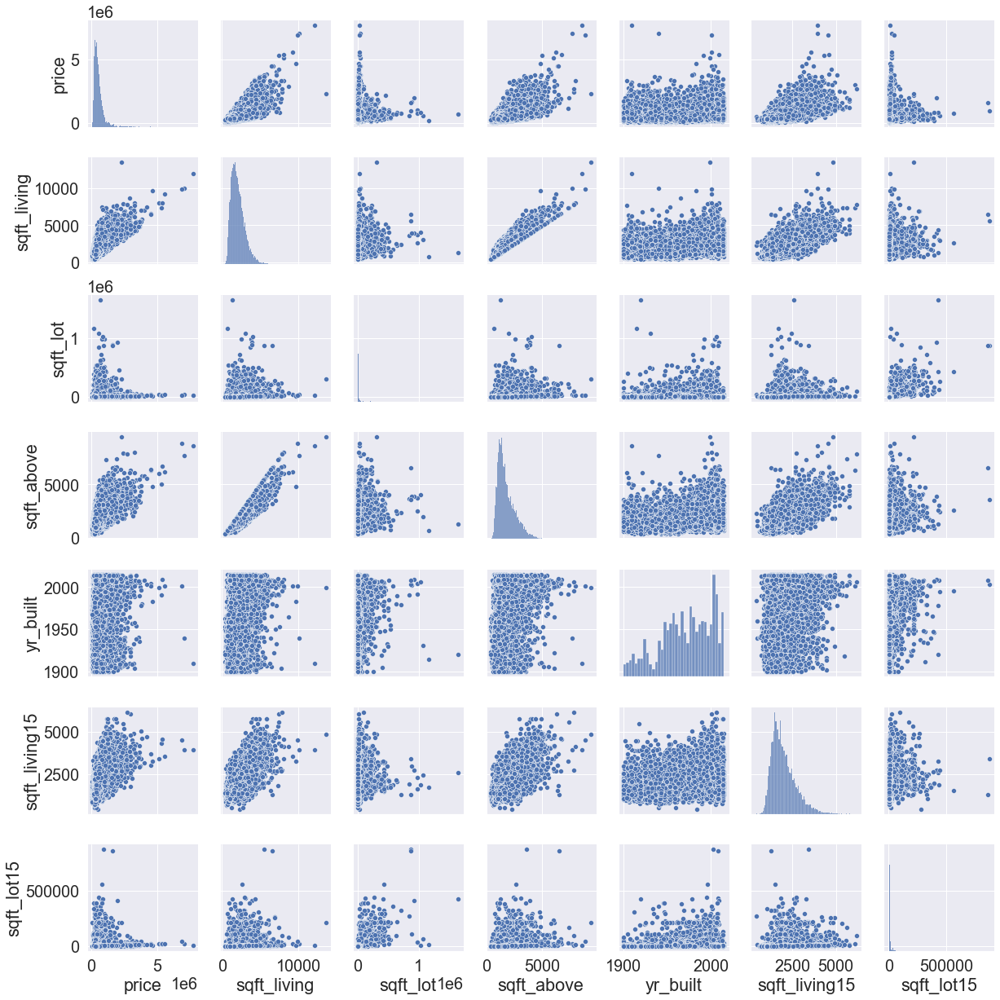

In [35]:
# Pairplot numerical features
numerical_cols = ['price', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 
                  'yr_built', 'sqft_living15', 'sqft_lot15']

sns.set(font_scale=1.8)
sns.pairplot(df[numerical_cols])
plt.show();

Features with positive correlations:  'sqft_above', 'sqft_living'.
One would expect higher housing price with recently built house, but the graph doesnt support this.

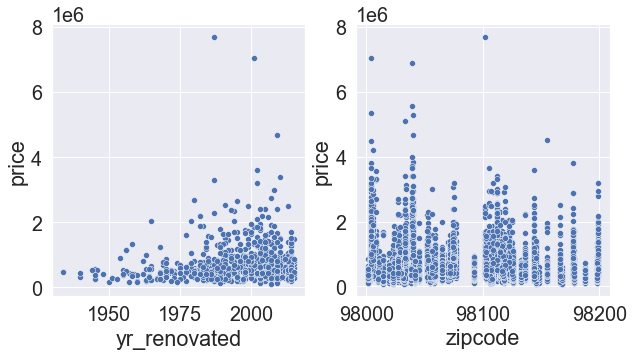

In [37]:
f, ax = plt.subplots(1,2, figsize=(10,5))
sns.scatterplot(x=df[df['yr_renovated']>0].yr_renovated, y=df.price, ax=ax[0])
sns.scatterplot(x=df.zipcode, y=df.price, ax=ax[1]);

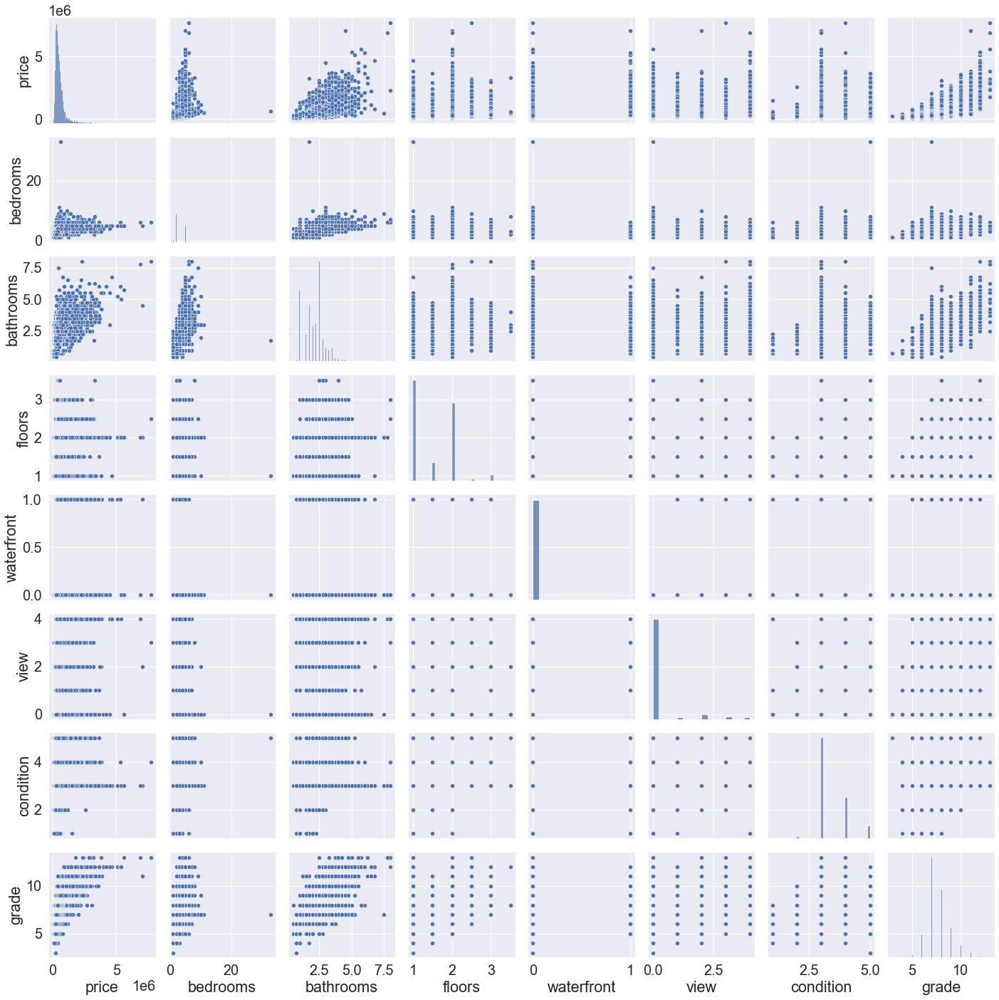

In [31]:
# Pairplot numerical features
categorical_cols = ['price', 'bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 
                    'condition', 'grade']
sns.set(font_scale=1.8)
sns.pairplot(df[categorical_cols])
plt.show();

We can see the price is correlated with 'bathroom's but not 'bedrooms'.
Also 'grade' seems to have positive correlation with the price

In [11]:
# Checking how many data will be lost if we drop the missing values

temp = {}
for col in df.columns:
    temp[col] = df[col].isna().sum()
    
# Switch key-value pairs
col_na = {}
for k,v in temp.items():
    col_na[v] = k
sorted(col_na.items(), reverse=True)

print('No. of observations:', df.shape[0])
print('Data after dropping missing values:', df.dropna().shape[0])
print('% drop:', (df.shape[0] - df.dropna().shape[0])/df.shape[0])

No. of observations: 21597
Data after dropping missing values: 15762
% drop: 0.2701764133907487


There is about 27% of missing values. Instead of removing those columns, we will keep the rows with missing values as these columns might be important in predicting housing price

In [12]:
# Some preprocessing 
# df.dropna(inplace=True)

# Create a new column year sold
df['yr_sold'] = pd.DatetimeIndex(df.date).year

# Here we convert column containing string to float datatype, also replace '?'
df['sqft_basement'] = df.sqft_basement.apply(lambda x: x.replace('?', '0')).astype(float)

# Removing outliers: In a test prediction with outliers, the result was very poor (R2 ~ < 0.6)
df = df[df['bedrooms'] < 33]
df = df[df['sqft_living'] < 13540]

### Basic preparation for baseline model

In [13]:
imputer_num = SimpleImputer(missing_values=np.nan, strategy ='median')
imputer_cat = SimpleImputer(strategy ='most_frequent')

df['yr_renovated'] = imputer_num.fit_transform(df['yr_renovated'].to_numpy().reshape(-1,1))
df['waterfront'] = imputer_cat.fit_transform(df['waterfront'].to_numpy().reshape(-1,1))
df['view'] = imputer_cat.fit_transform(df['view'].to_numpy().reshape(-1,1))

In [14]:
columns_to_drop = ['id', 'date', 'price']

In [15]:
# Prepare the data for training 

def create_train_test(df, columns_to_drop):
    
    X = df.drop(columns_to_drop, axis=1)
    y = df['price']

    # Create feature list for feature importance analysis after prediction
    features = list(X.columns)

    # # Shuffling for randomness
    X, y = shuffle(X, y, random_state=42)
    
    # Split into train-test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    return X_train, X_test, y_train, y_test, features

# **********************************************************
# # Scale the data: This will be included in the pipeline
# scaler = StandardScaler()
# scaler.fit(X_train)

# X_train = scaler.transform(X_train)
# X_test = scaler.transform(X_test)

In [16]:
def get_metrics(test, pred):
    '''
    A simple function to output some metrics for linear regression model
    '''
    print("Mean absolute error =", round(metrics.mean_absolute_error(test, pred), 2)) 
    print("Mean squared error =", round(metrics.mean_squared_error(test, pred), 2)) 
    print("Median absolute error =", round(metrics.median_absolute_error(test, pred), 2)) 
    print("Explain variance score =", round(metrics.explained_variance_score(test, pred), 2)) 
    print("R2 score =", round(metrics.r2_score(test, pred), 2))

In [17]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

In [18]:
pipeline = make_pipeline(
    # Fill missing data,
    # impute,
    # one hote encoding,
    StandardScaler(),
    LinearRegression(),  
)

#### Baseline Model

In [19]:
baseline_model = pipeline.fit(X_train, y_train)

# Predict response 
y_pred = pipeline.predict(X_test)

get_metrics(y_test, y_pred)


# Make a prediction with CV
scores = cross_val_score(baseline_model, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 125715.85
Mean squared error = 40004964034.45
Median absolute error = 89165.7
Explain variance score = 0.71
R2 score = 0.71

RMSE scores: [205766.61066495 196890.11345714 204050.98885613 206777.59859617
 193726.37345544]


In [20]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model = sm.OLS(y_train, X_int).fit()
stats_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     2119.
Date:                Wed, 10 Mar 2021   Prob (F-statistic):               0.00
Time:                        14:50:44   Log-Likelihood:            -2.3544e+05
No. Observations:               17276   AIC:                         4.709e+05
Df Residuals:                   17256   BIC:                         4.711e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.396e+05   1526.874    353.396      0.000    5.37e+05    5.43e+05
x1         -3.558e+04   1989.693    -17.882      0.000   -3.95e+04   -3.17e+04
x2          3.023e+04   2791.255     10.831      0.000    2.48e+04    3.57e+04
x3          9.973e+04   1.98e+04      5.030      0.000    6.09e+04    1.39e+05
x4          6181.2548   2223.260      2.780      0.005    1823.440    1.05e+04
x5          5102.7020   2171.226      2.350      0.019     846.879    9358.525
x6          4.748e+04   1662.390     28.559      0.000    4.42e+04    5.07e+04
x7          4.055e+04   1809.063     22.415      0.000     3.7e+04    4.41e+04
x8          1.807e+04   1708.200     10.579      0.000    1.47e+04    2.14e+04
x9          1.111e+05   2827.868     39.271      0.000    1.06e+05    1.17e+05
x10         6.289e+04   1.79e+04      3.516      0.000    2.78e+04    9.79e+04
x11         2.242e+04   9409.795      2.382      0.017    3973.284    4.09e+04
x12        -7.673e+04   2365.995    -32.430      0.000   -8.14e+04   -7.21e+04
x13         1.028e+04   1615.906      6.362      0.000    7112.496    1.34e+04
x14        -3.156e+04   1964.451    -16.067      0.000   -3.54e+04   -2.77e+04
x15         8.389e+04   1657.052     50.626      0.000    8.06e+04    8.71e+04
x16        -3.066e+04   2053.131    -14.935      0.000   -3.47e+04   -2.66e+04
x17         1.562e+04   2633.920      5.929      0.000    1.05e+04    2.08e+04
x18        -1.021e+04   2244.371     -4.551      0.000   -1.46e+04   -5814.052
x19         1.492e+04   1531.645      9.739      0.000    1.19e+04    1.79e+04
==============================================================================
Omnibus:                    14578.083   Durbin-Watson:                   2.023
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1360891.021
Skew:                           3.545   Prob(JB):                         0.00
Kurtosis:                      45.899   Cond. No.                         42.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [21]:
def feature_importance(coefficients, features):
    '''
    Create feature comparison plots
    
    '''

    temp1 = dict(zip(features, coefficients))
    temp2 = dict(zip(features, abs(coefficients)))

    
    fig, ax = plt.subplots(1,2, figsize=(20,5))    
    
    ax[0].bar(range(len(temp1)), list(temp1.values()), align='center')
    ax[0].set_xticks(range(len(temp1))) 
    ax[0].set_xticklabels(labels = list(temp1.keys()), rotation='vertical', fontsize=16);    

    ax[1].bar(range(len(temp2)), list(temp2.values()), align='center')
    ax[1].set_xticks(range(len(temp2))) 
    ax[1].set_xticklabels(labels = list(temp2.keys()), rotation='vertical', fontsize=16);    


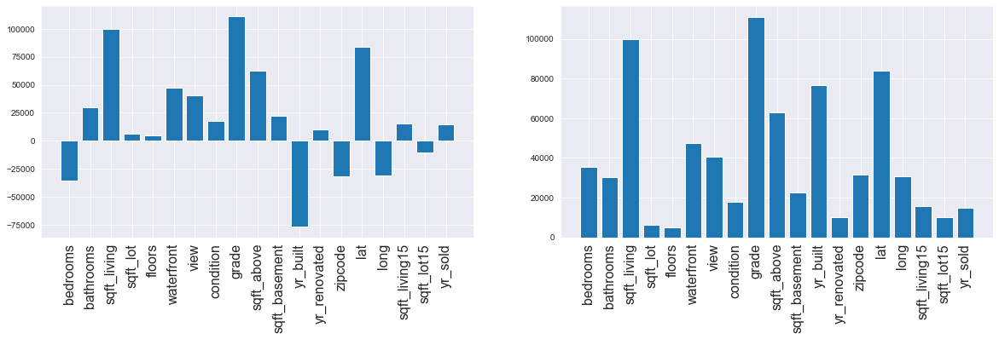

In [22]:
feature_importance(baseline_model[1].coef_, features)

Both sklearn and statsmodel produced similar prediction result with R2 value ~0.7.
This fairly good for a baseline model. Let's evaluate if the linear regression assumptions hold at this prediction level.

In [23]:
### Checking Linear Regression assumptions

def test_linearity(model, x, y):
    '''
    Computes plots to inspect linearity assumptions for a linear regression
    Input is the stats model
    '''
    y_pred = pipeline.predict(x)

    fig, ax = plt.subplots(1,2)
    
    sns.regplot(x=y_pred, y=y, lowess=True, ax=ax[0], line_kws={'color': 'red'})
    ax[0].set_title('Observed vs. Predicted Values', fontsize=10)
    ax[0].set(xlabel='Predicted', ylabel='Observed')
 
    sns.regplot(x=y_pred, y=y-y_pred, lowess=True, ax=ax[1], line_kws={'color': 'red'})
    ax[1].set_title('Residuals vs. Predicted Values', fontsize=10)
    ax[1].set(xlabel='Predicted', ylabel='Residuals')
    
    plt.tight_layout();

In [25]:
# Normality test
def test_normality(y_test, y_pred, stats_model):
    
    ax1 = plt.subplot(221)
    res = stats.probplot(stats_model.resid, plot=plt)
    
    ax2 = plt.subplot(222)
    sns.histplot(y_test - y_pred)
    plt.xlabel('Residual')
    plt.tight_layout()
    plt.show();

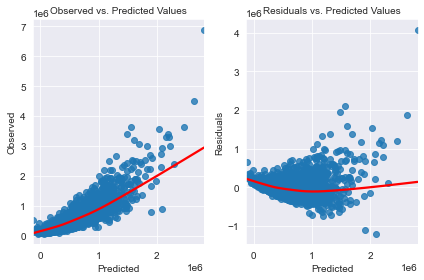

In [24]:
test_linearity(baseline_model, X_test, y_test)

The points should be symmetrically distributed around a diagonal line in the first and around a horizontal line the second plot. The 'bowed' pattern indicates that the model has made synthetic errors when making prediction. The second plot on the right also indicates the model suffers from 'heteroscedasticity'.

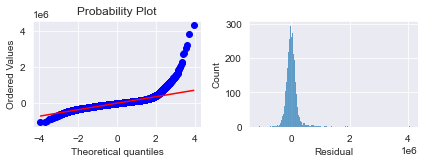

In [26]:
test_normality(y_test, y_pred, stats_model)

Although, the histogram of the Residual looks somewhat Normal, the q-q plot indicates non-normal distribution. What can we do about it?

### Feature Engineering

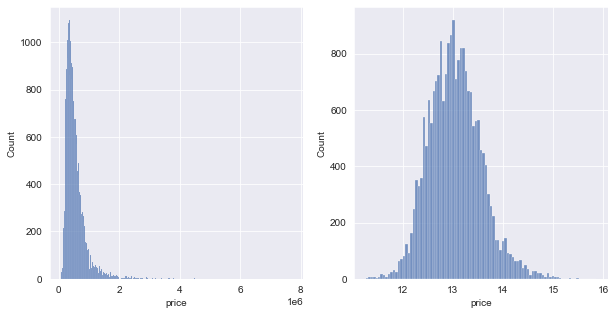

In [27]:
# The price data doesn't seem to be normally distributed, below we will normalize this data.

f, ax = plt.subplots(1,2, figsize=(10,5))
sns.set(font_scale=1)

sns.histplot(df.price, ax=ax[0]);

df['price'] = np.log(df['price'])

sns.histplot(df.price, ax=ax[1]);

In [28]:
df['age_built'] = 2020 - df['yr_built']
df['age_renovated'] = df['yr_renovated'].apply(lambda x: 1 if x!= 0 else 0)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,age_built,age_renovated
0,7129300520,10/13/2014,12.309982,3,1.00,1180,5650,1.0,0.0,0.0,...,1955,0.0,98178,47.5112,-122.257,1340,5650,2014,65,0
1,6414100192,12/9/2014,13.195614,3,2.25,2570,7242,2.0,0.0,0.0,...,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,69,1
2,5631500400,2/25/2015,12.100712,2,1.00,770,10000,1.0,0.0,0.0,...,1933,0.0,98028,47.7379,-122.233,2720,8062,2015,87,0
3,2487200875,12/9/2014,13.311329,4,3.00,1960,5000,1.0,0.0,0.0,...,1965,0.0,98136,47.5208,-122.393,1360,5000,2014,55,0
4,1954400510,2/18/2015,13.142166,3,2.00,1680,8080,1.0,0.0,0.0,...,1987,0.0,98074,47.6168,-122.045,1800,7503,2015,33,0


In [29]:
columns_to_drop = ['id', 'date', 'price', 'yr_built', 'yr_renovated']

In [30]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

#### Model 2

In [31]:
model2 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred2 = pipeline.predict(X_test)

get_metrics(y_test, y_pred2)


# Make a prediction with CV
scores = cross_val_score(model2, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 0.19
Mean squared error = 0.06
Median absolute error = 0.16
Explain variance score = 0.77
R2 score = 0.77

RMSE scores: [0.25308272 0.25499166 0.25111444 0.24657098 0.25206346]


In [32]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model2 = sm.OLS(y_train, X_int).fit()
stats_model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.772
Method:                 Least Squares   F-statistic:                     3080.
Date:                Wed, 10 Mar 2021   Prob (F-statistic):               0.00
Time:                        14:51:54   Log-Likelihood:                -643.08
No. Observations:               17276   AIC:                             1326.
Df Residuals:                   17256   BIC:                             1481.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0471      0.002   6824.248      0.000      13.043      13.051
x1            -0.0127      0.002     -5.084      0.000      -0.018      -0.008
x2             0.0557      0.003     15.939      0.000       0.049       0.063
x3             0.1459      0.025      5.879      0.000       0.097       0.195
x4             0.0192      0.003      6.883      0.000       0.014       0.025
x5             0.0412      0.003     15.157      0.000       0.036       0.047
x6             0.0305      0.002     14.657      0.000       0.026       0.035
x7             0.0491      0.002     21.654      0.000       0.045       0.053
x8             0.0416      0.002     19.473      0.000       0.037       0.046
x9             0.1846      0.004     52.143      0.000       0.178       0.192
x10           -0.0161      0.022     -0.718      0.473      -0.060       0.028
x11           -0.0028      0.012     -0.234      0.815      -0.026       0.020
x12           -0.0357      0.002    -14.505      0.000      -0.041      -0.031
x13            0.1955      0.002     94.211      0.000       0.191       0.200
x14           -0.0242      0.003     -9.405      0.000      -0.029      -0.019
x15            0.0664      0.003     20.142      0.000       0.060       0.073
x16           -0.0053      0.003     -1.899      0.058      -0.011       0.000
x17            0.0249      0.002     12.964      0.000       0.021       0.029
x18            0.1018      0.003     34.353      0.000       0.096       0.108
x19            0.0142      0.002      6.996      0.000       0.010       0.018
==============================================================================
Omnibus:                      246.488   Durbin-Watson:                   2.023
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              465.831
Skew:                          -0.023   Prob(JB):                    7.01e-102
Kurtosis:                       3.803   Cond. No.                         42.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Just by normalizing the 'price' feature and converting categorical features of yr_built and yr_renovated to numerical one, we got significant increase in R2 score. Lets check if the linearity assumption hold this time?

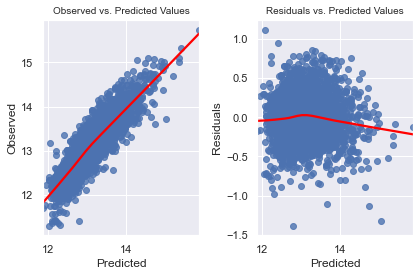

In [34]:
test_linearity(model2, X_test, y_test)

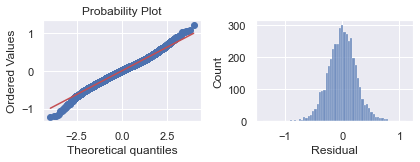

In [35]:
test_normality(y_test, y_pred2, stats_model2)

This time we can observe the linearity assumption is preserved better by the model2. We can further evaluate if there is strong multicollinearity in the data by looking at cross-correlation between individual features

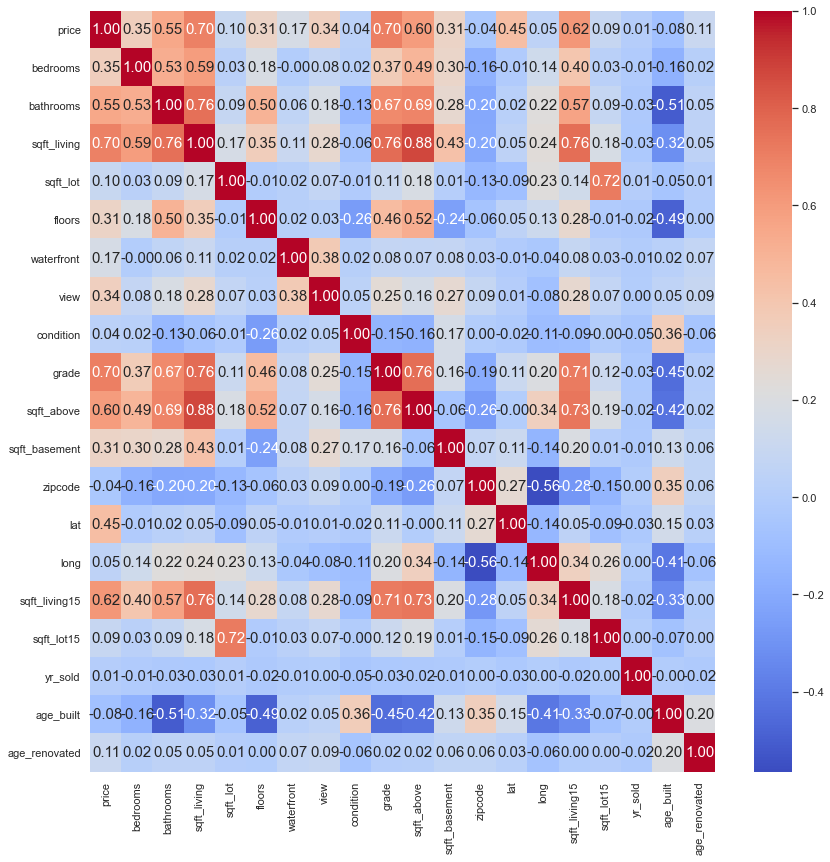

In [36]:
# Create a correlation table
df2 = df.drop(columns = ['id', 'date', 'yr_built', 'yr_renovated'])
corr = df2.corr()
plt.figure(figsize=(14,14))
sns.heatmap(corr, annot=True, fmt = '.2f', annot_kws={'size':15}, cmap='coolwarm')
plt.show();
# print(corr)

In [37]:
corr_features=[]
for i, r in df2.corr().iterrows():
    k = 0
    for j in range(len(r)):
        if i != r.index[k]:
            if r.values[k] >= 0.7:
                corr_features.append([i, r.index[k], r.values[k]])
            k += 1
corr_features

[['sqft_living', 'bathrooms', 0.7550814707354999],
 ['grade', 'price', 0.7036013757509503],
 ['grade', 'sqft_living', 0.7636377968112544],
 ['sqft_above', 'sqft_living', 0.8760072572143447],
 ['sqft_above', 'grade', 0.7562161098910872],
 ['sqft_living15', 'sqft_living', 0.7570252101047186],
 ['sqft_living15', 'grade', 0.7136613129104644],
 ['sqft_living15', 'sqft_above', 0.7317073728567842],
 ['sqft_lot15', 'sqft_lot', 0.7175117170369022]]

We can see 'sqft_above' and 'sqft_living' have the highest correlation of 0.87.
In the next model, we will try to drop some of the highly correlated features as well as some features that have weak correlation with the housing price. 

In [38]:
columns_to_drop = ['id', 'date', 'price', 'yr_built', 'yr_renovated', 'yr_sold',
                   'sqft_above', 'sqft_lot', 'sqft_lot15',  'sqft_living15', 
                   'condition', 'waterfront']

In [39]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

#### Model 3

In [40]:
model3 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred3 = pipeline.predict(X_test)

get_metrics(y_test, y_pred3)


# Make a prediction with CV
scores = cross_val_score(model3, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 0.2
Mean squared error = 0.07
Median absolute error = 0.16
Explain variance score = 0.76
R2 score = 0.76

RMSE scores: [0.26194185 0.26446963 0.25748106 0.25510325 0.25878348]


There is not much improvement in the performance by dropping some of the features

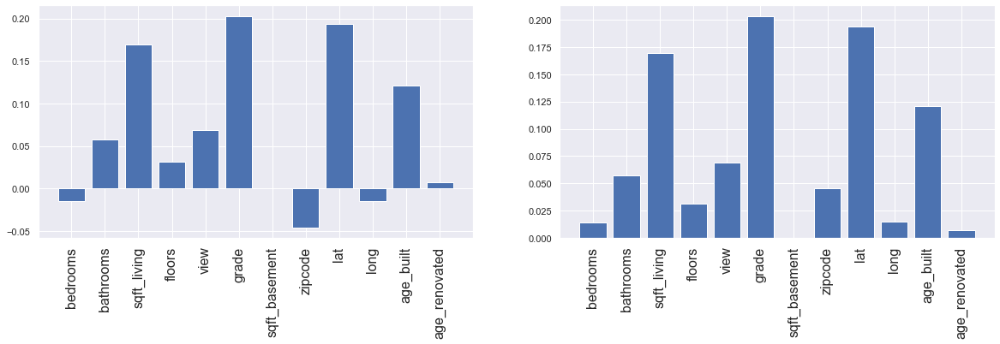

In [42]:
feature_importance(model3[1].coef_, features)

Top 4 features are sqft_living, grade, lat, and age_built. It is also strange that latitude seems to affect the modeling. In a test, both latitude and longitude information were dropped, and the model performed poorly. Now, the latitude increase as we go further north, does that mean the northern area are more expensive than the southern ones?

In [43]:
def location_map(df, color, title):
    fig = px.scatter_mapbox(df, lat="lat", lon="long",
                            #size = 'price',
                            color = color,                               
                            size_max = 20,
                            zoom=8, 
                            height=500,
                            title = title,
                            hover_data={'zipcode': True,
                                        'lat': False,
                                        'long': False,
                                        'price': True,
                                        'yr_built': True,
                                        'bedrooms':True,
                                        'sqft_living':True
                                        }
                            )
    fig.update_layout(mapbox_style="open-street-map")
    # fig.update_layout(margin={"r":10,"t":10,"l":50,"b":0})
    fig.show()

In [44]:
location_map(df, 'price', title = "Housing location with Price")

It may appear that northern area have houses with higher prices! In addition, the housing price are lowered further away from the downtown Seattle!

### Further feature engineering

In [45]:
from geopy import distance

lat_long = df['lat'].astype(str) + ',' + df['long'].astype(str)
lat_long = list(map(eval, lat_long))
Seattle = (47.6062, -122.3321)
miles = []
for i in lat_long:
    miles.append(round(distance.distance(i, Seattle).miles, 1))
df['distance'] = miles

<AxesSubplot:xlabel='distance', ylabel='price'>

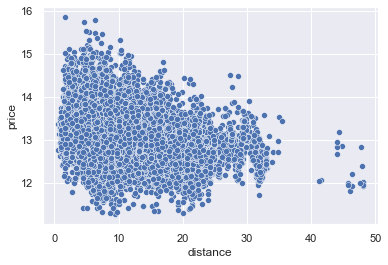

In [46]:
sns.scatterplot(x=df.distance, y=df.price)

The distance from Seattle downtown seems to have negative correlation with the price

In [48]:
# We will go back to drop the columns for model 2
columns_to_drop = ['id', 'date', 'price', 'yr_built', 'yr_renovated']

In [49]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

In [50]:
model4 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred4 = pipeline.predict(X_test)

get_metrics(y_test, y_pred4)


# Make a prediction with CV
scores = cross_val_score(model4, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 0.18
Mean squared error = 0.05
Median absolute error = 0.14
Explain variance score = 0.81
R2 score = 0.81

RMSE scores: [0.23211188 0.23633578 0.23080209 0.2262156  0.23135543]


In [51]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model4 = sm.OLS(y_train, X_int).fit()
stats_model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                     3614.
Date:                Wed, 10 Mar 2021   Prob (F-statistic):               0.00
Time:                        15:00:23   Log-Likelihood:                 798.80
No. Observations:               17276   AIC:                            -1556.
Df Residuals:                   17255   BIC:                            -1393.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0471      0.002   7418.039      0.000      13.044      13.051
x1            -0.0113      0.002     -4.910      0.000      -0.016      -0.007
x2             0.0475      0.003     14.760      0.000       0.041       0.054
x3             0.1192      0.023      5.220      0.000       0.074       0.164
x4             0.0247      0.003      9.656      0.000       0.020       0.030
x5             0.0206      0.003      8.151      0.000       0.016       0.026
x6             0.0327      0.002     17.049      0.000       0.029       0.036
x7             0.0513      0.002     24.599      0.000       0.047       0.055
x8             0.0424      0.002     21.559      0.000       0.039       0.046
x9             0.1617      0.003     49.236      0.000       0.155       0.168
x10            0.0271      0.021      1.314      0.189      -0.013       0.068
x11            0.0021      0.011      0.193      0.847      -0.019       0.023
x12           -0.0487      0.002    -21.393      0.000      -0.053      -0.044
x13            0.1091      0.002     44.457      0.000       0.104       0.114
x14            0.0694      0.003     23.953      0.000       0.064       0.075
x15            0.0594      0.003     19.559      0.000       0.053       0.065
x16            0.0072      0.003      2.779      0.005       0.002       0.012
x17            0.0245      0.002     13.890      0.000       0.021       0.028
x18            0.0650      0.003     23.176      0.000       0.059       0.070
x19            0.0168      0.002      9.018      0.000       0.013       0.020
x20           -0.1924      0.003    -55.987      0.000      -0.199      -0.186
==============================================================================
Omnibus:                      458.168   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              990.793
Skew:                          -0.143   Prob(JB):                    7.11e-216
Kurtosis:                       4.138   Cond. No.                         42.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

So far, the model 4 seems to perform the best out of all the models. Next, we will check the linearity assumptions

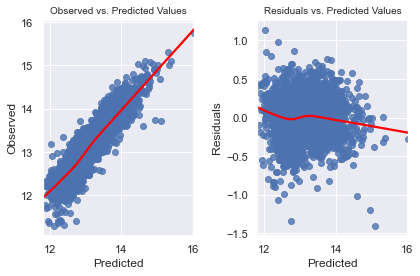

In [52]:
test_linearity(model4, X_test, y_test)

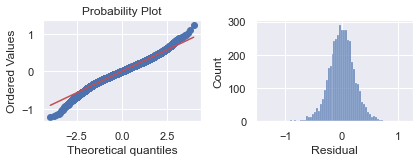

In [53]:
test_normality(y_test, y_pred4, stats_model4)

The linearity assumptions seems to hold as well. We will try one last model with polynomial features!

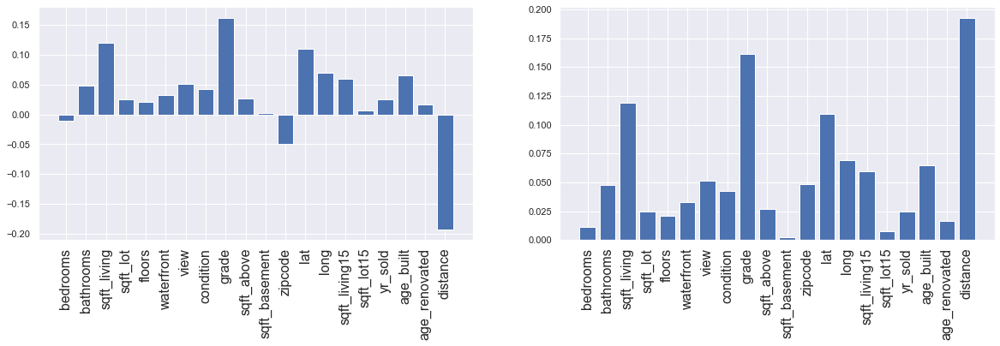

In [54]:
feature_importance(model4[1].coef_, features)

## Conclusion

Out of all of the features, the most important features seems to be the distance from the downtown which is very obvious. As we go away from the center of the city, the housing price will decrease. The grade system is the second highest contributing factor followed by the area of the housing. It will be important for the Infinity Real Estates to invest on the properties that have been graded higher in genreal. Some zipcodes might have direct influence on the housing price (as expected from high figure population occupying those zipcodes), however, in genral, zipcode doesn't seems to be the primary factors. 

### Future Improvements

In this project, a very minimal feature engineering has been implemented. A linear regression with polynomial features (see Appendix) seems to increase the prediction accuracy, however such implementation will be dangerous as it may break the Linearity assumptions. Alternatively, a more more sophisticated feature engineering can be implemented which may improve the price prediction. Finally, more advanced algorithms such as tree based modeling or Neural Network may be superior for more accurate modeling.

# Appendix

### Model with polynomial

In [55]:
polynomial = make_pipeline(
    # Fill missing data
    # impute
    StandardScaler(),
    PolynomialFeatures(degree=2, include_bias=True),
    LinearRegression()   
)
model_poly = polynomial.fit(X_train, y_train)

# Predict response 
y_pred_poly = polynomial.predict(X_test)

get_metrics(y_test, y_pred_poly)

Mean absolute error = 0.14
Mean squared error = 0.03
Median absolute error = 0.1
Explain variance score = 0.88
R2 score = 0.88


In [56]:
# Make a prediction with CV

scores_poly = cross_val_score(model_poly, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores_poly = np.sqrt(-scores)
rmse_scores_poly
# scores.mean(), scores.std()

array([0.23211188, 0.23633578, 0.23080209, 0.2262156 , 0.23135543])

In [59]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
# scaler = StandardScaler()
# scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
poly_features = PolynomialFeatures(degree=2)
Xp = poly_features.fit_transform(X_train_scaled)

X_int_poly = sm.add_constant(Xp)
stats_model_poly = sm.OLS(y_train, X_int_poly).fit()
stats_model_poly.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     565.1
Date:                Wed, 10 Mar 2021   Prob (F-statistic):               0.00
Time:                        15:05:02   Log-Likelihood:                 5052.2
No. Observations:               17276   AIC:                            -9650.
Df Residuals:                   17049   BIC:                            -7889.
Df Model:                         226                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.7980      0.098     79.918      0.000       7.607       7.989
x1            -0.0070      0.002     -3.307      0.001      -0.011      -0.003
x2             0.0265      0.003      9.191      0.000       0.021       0.032
x3             0.1297      0.027      4.738      0.000       0.076       0.183
x4             0.0785      0.007     12.050      0.000       0.066       0.091
x5            -0.0183      0.003     -6.468      0.000      -0.024      -0.013
x6            -0.6543      0.008    -79.845      0.000      -0.670      -0.638
x7             0.0252      0.005      5.250      0.000       0.016       0.035
x8             0.0422      0.003     16.811      0.000       0.037       0.047
x9             0.1102      0.003     38.000      0.000       0.105       0.116
x10            0.0743      0.025      3.006      0.003       0.026       0.123
x11            0.0112      0.014      0.827      0.408      -0.015       0.038
x12           -0.0496      0.003    -19.456      0.000      -0.055      -0.045
x13            0.2763      0.111      2.486      0.013       0.058       0.494
x14           -0.0498      0.132     -0.378      0.705      -0.308       0.208
x15            0.0719      0.003     24.225      0.000       0.066       0.078
x16            0.0099      0.006      1.620      0.105      -0.002       0.022
x17           -3.7343      0.047    -79.544      0.000      -3.826      -3.642
x18           -0.0193      0.003     -5.855      0.000      -0.026      -0.013
x19           -1.4673      0.018    -79.863      0.000      -1.503      -1.431
x20           -0.0537      0.274     -0.196      0.844      -0.590       0.483
x21            0.0004      0.001      0.269      0.788      -0.002       0.003
x22           -0.0039      0.003     -1.344      0.179      -0.010       0.002
x23           -0.0328      0.019     -1.718      0.086      -0.070       0.005
x24            0.0068      0.003      2.206      0.027       0.001       0.013
x25            0.0173      0.003      6.283      0.000       0.012       0.023
x26           -0.0021      0.002     -1.202      0.229      -0.006       0.001
x27           -0.0005      0.002     -0.244      0.807      -0.004       0.003
x28        -3.888e-05      0.002     -0.020      0.984      -0.004       0.004
x29            0.0085      0.003      2.620      0.009       0.002       0.015
x30            0.0077      0.017      0.445      0.656      -0.026       0.042
x31            0.0107      0.009      1.183      0.237      -0.007       0.028
x32            0.0008      0.002      0.350      0.726      -0.004       0.006
x33            0.0021      0.003      0.793      0.428      -0.003       0.007
x34           -0.0021      0.003     -0.641      0.522      -0.009       0.004
x35            0.0086      0.003      2.857      0.004       0.003       0.015
x3

### Preprocess categorical features

In [60]:
df_oh = df.copy(deep=True)
df_oh.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_sold', 'age_built',
       'age_renovated', 'distance'],
      dtype='object')

In [61]:
# Preprocess categorical features

def floor(x):
    
    if x > 1 and x <= 2:  
        floor = 'Two_floor' 
    elif x >= 3 :
        floor = 'Three_floor'
    else:
        floor = 'One_floor'         
    return floor

def bedroom(x):
    
    if x <= 3:
        room = 'few_bed'
    elif x > 3 and x <= 6:
        room = 'medium_bed'
    else:
        room = 'extra_bed'
    return room


def bathroom(x):
    
    if x <= 1:
        bath = 'one_bath'
    elif x > 1 and x <= 2:
        bath = 'two_bath'
    elif x > 2 and x <= 3:
        bath = 'three_bath'
    elif x > 3 and x <= 4:
        bath = 'four_bath'
    elif x > 4 and x <= 5:
        bath = 'five_bath'
    elif x > 5 and x <= 6:
        bath = 'six_bath'
    elif x > 6 and x <= 7:
        bath = 'seven_bath'
    else:
        bath = 'eight_bath'
    return bath

In [62]:
df_oh['floor_cat'] = df_oh['floors'].apply(floor).astype('category')
df_oh['bedroom_cat'] = df_oh['bedrooms'].apply(bedroom).astype('category')
df_oh['bathroom_cat'] = df_oh['bathrooms'].apply(bathroom).astype('category')

In [63]:
# One hot encoding
categorical_var = ['bedroom_cat', 'bathroom_cat', 'floor_cat']

df_oh = pd.get_dummies(df_oh, columns=(categorical_var), drop_first=True, prefix=None)
df_oh.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,bedroom_cat_medium_bed,bathroom_cat_five_bath,bathroom_cat_four_bath,bathroom_cat_one_bath,bathroom_cat_seven_bath,bathroom_cat_six_bath,bathroom_cat_three_bath,bathroom_cat_two_bath,floor_cat_Three_floor,floor_cat_Two_floor
0,7129300520,10/13/2014,12.309982,3,1.00,1180,5650,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
1,6414100192,12/9/2014,13.195614,3,2.25,2570,7242,2.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,1
2,5631500400,2/25/2015,12.100712,2,1.00,770,10000,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
3,2487200875,12/9/2014,13.311329,4,3.00,1960,5000,1.0,0.0,0.0,...,1,0,0,0,0,0,1,0,0,0
4,1954400510,2/18/2015,13.142166,3,2.00,1680,8080,1.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0


In [64]:
df_oh.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_sold', 'age_built',
       'age_renovated', 'distance', 'bedroom_cat_few_bed',
       'bedroom_cat_medium_bed', 'bathroom_cat_five_bath',
       'bathroom_cat_four_bath', 'bathroom_cat_one_bath',
       'bathroom_cat_seven_bath', 'bathroom_cat_six_bath',
       'bathroom_cat_three_bath', 'bathroom_cat_two_bath',
       'floor_cat_Three_floor', 'floor_cat_Two_floor'],
      dtype='object')

In [65]:
columns_to_drop = ['id', 'date', 'price', 'bedrooms', 'bathrooms', 'floors', 
                   'yr_built', 'yr_renovated', 'sqft_above', 'yr_sold', 'sqft_lot', 
                   'sqft_lot15',  'sqft_living15', 'condition']

In [66]:
X_train, X_test, y_train, y_test, features = create_train_test(df_oh, columns_to_drop)

In [67]:
features

['sqft_living',
 'waterfront',
 'view',
 'grade',
 'sqft_basement',
 'zipcode',
 'lat',
 'long',
 'age_built',
 'age_renovated',
 'distance',
 'bedroom_cat_few_bed',
 'bedroom_cat_medium_bed',
 'bathroom_cat_five_bath',
 'bathroom_cat_four_bath',
 'bathroom_cat_one_bath',
 'bathroom_cat_seven_bath',
 'bathroom_cat_six_bath',
 'bathroom_cat_three_bath',
 'bathroom_cat_two_bath',
 'floor_cat_Three_floor',
 'floor_cat_Two_floor']

In [68]:
model6 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred6 = pipeline.predict(X_test)

get_metrics(y_test, y_pred6)


# Make a prediction with CV
scores = cross_val_score(model6, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 0.18
Mean squared error = 0.06
Median absolute error = 0.15
Explain variance score = 0.8
R2 score = 0.8

RMSE scores: [0.23837815 0.2455548  0.23859859 0.23247702 0.23779324]


In [69]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model6 = sm.OLS(y_train, X_int).fit()
stats_model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     3050.
Date:                Wed, 10 Mar 2021   Prob (F-statistic):               0.00
Time:                        15:07:55   Log-Likelihood:                 283.79
No. Observations:               17276   AIC:                            -521.6
Df Residuals:                   17253   BIC:                            -343.2
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0471      0.002   7199.748      0.000      13.044      13.051
x1             0.1995      0.004     48.236      0.000       0.191       0.208
x2             0.0317      0.002     16.071      0.000       0.028       0.036
x3             0.0613      0.002     28.889      0.000       0.057       0.065
x4             0.1766      0.003     54.193      0.000       0.170       0.183
x5            -0.0198      0.003     -7.803      0.000      -0.025      -0.015
x6            -0.0555      0.002    -23.933      0.000      -0.060      -0.051
x7             0.1081      0.003     42.710      0.000       0.103       0.113
x8             0.0795      0.003     26.823      0.000       0.074       0.085
x9             0.0888      0.003     32.227      0.000       0.083       0.094
x10            0.0094      0.002      4.981      0.000       0.006       0.013
x11           -0.1892      0.003    -54.329      0.000      -0.196      -0.182
x12            0.0519      0.018      2.906      0.004       0.017       0.087
x13            0.0415      0.018      2.344      0.019       0.007       0.076
x14            0.0713      0.024      2.954      0.003       0.024       0.119
x15            0.2016      0.063      3.196      0.001       0.078       0.325
x16            0.2370      0.093      2.544      0.011       0.054       0.420
x17            0.0047      0.004      1.152      0.249      -0.003       0.013
x18            0.0279      0.009      3.001      0.003       0.010       0.046
x19            0.3675      0.119      3.082      0.002       0.134       0.601
x20            0.3190      0.110      2.899      0.004       0.103       0.535
x21            0.0052      0.002      2.511      0.012       0.001       0.009
x22            0.0093      0.002      3.822      0.000       0.005       0.014
==============================================================================
Omnibus:                      461.510   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1121.566
Skew:                          -0.066   Prob(JB):                    2.85e-244
Kurtosis:                       4.241   Cond. No.                         230.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

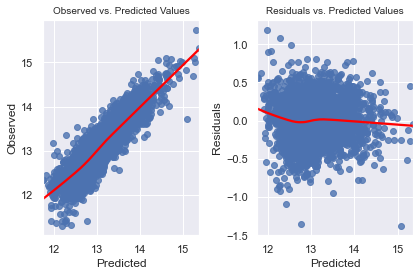

In [70]:
test_linearity(model6, X_test, y_test)

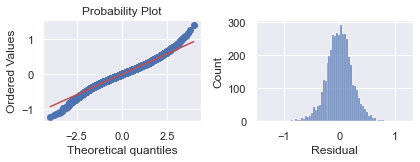

In [71]:
test_normality(y_test, y_pred6, stats_model6)